In [4]:
#Bibliotecas
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

#Função para apresentação da imagem
def apresentaImg(imagem):
    img = plt.figure(figsize=(30,28))
    ax = img.add_subplot(111)
    ax.imshow(imagem, cmap = 'gray')
    plt.show()
    
#Carregando as Imagens
leite_condensado = cv2.imread('leite_condensado.jpg')
leite_condensado = cv2.cvtColor(leite_condensado, cv2.COLOR_BGR2GRAY)

pratileira_leite = cv2.imread('pratileira_leite.jpg')
pratileira_leite = cv2.cvtColor(pratileira_leite, cv2.COLOR_BGR2GRAY)


#sift = cv2.xfeatures2d.SIFT_create() Depreciado
#Substituir por
sift = cv2.SIFT_create()  # Aqui, corrigido para cv2.SIFT_create()


kp1, des1 = sift.detectAndCompute(leite_condensado, None)
kp2, des2 = sift.detectAndCompute(pratileira_leite, None)

In [6]:
FLANN_INDEX_KDTREE = 0

index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)

In [8]:
flann = cv2.FlannBasedMatcher(index_params, search_params)

In [10]:
matches = flann.knnMatch(des1,des2, k = 2)

In [12]:
good = []

for match1, match2 in matches:
    if match1.distance < 0.75*match2.distance:
        good.append([match1])

In [14]:
len(good)

133

In [16]:
flann_matches = cv2.drawMatchesKnn(leite_condensado, kp1, pratileira_leite, kp2, good, None, flags = 0)

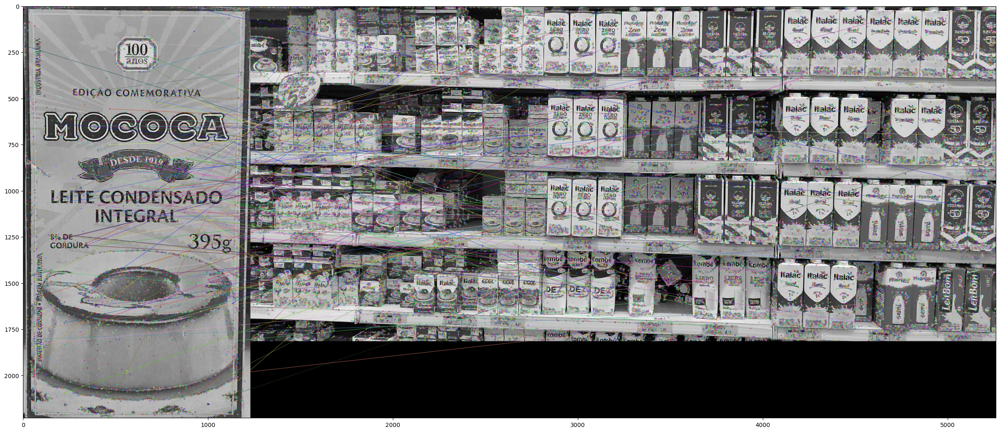

In [18]:
apresentaImg(flann_matches)

In [20]:
matchesMask = [[0,0] for i in range(len(matches))]

In [22]:
#matchesMask

In [24]:

for i, (match1, match2) in enumerate(matches):
    if match1.distance < 0.5*match2.distance:
        matchesMask[i] = [1,0]

In [26]:
draw_params = dict(matchColor = (0,0,255), singlePointColor = (255,0,0), matchesMask = matchesMask, flags = 0)

In [28]:
flann_matches = cv2.drawMatchesKnn(leite_condensado, kp1, pratileira_leite, kp2, matches, None, **draw_params)

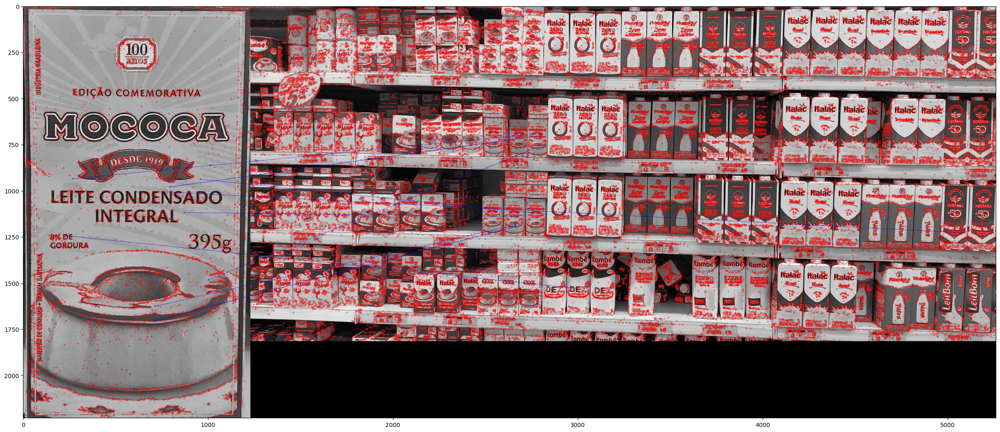

In [30]:
apresentaImg(flann_matches)